### practice with polar coordinated data

In [1]:
import numpy as np
import librosa, os
from IPython.display import Audio

Data_path = os.path.pardir
Data_path += "/Data/kaggle_data/common-voice/"
test_data_path = Data_path + "cv-valid-train/cv-valid-train/sample-000006.mp3"

voice_source, sample_rate = librosa.load(test_data_path, mono=True)

print("Length : {}".format(len(voice_source)))
print("Sample rate : {}".format(sample_rate))
print("L / R : {:.2f} sec".format(len(voice_source) / sample_rate))
display(Audio(voice_source, rate=sample_rate))

music_data_path = "../Data/sample/Jonas Blue - Fast Car ft. Dakota (Official Video).mp3"

print(sample_rate)
music_source, sample_rate = librosa.load(music_data_path, mono=True, duration=(len(voice_source) / sample_rate))

print("Length : {}".format(len(music_source)))
print("Sample rate : {}".format(sample_rate))
print("L / R : {:.2f} sec".format(len(music_source) / sample_rate))

display(Audio(music_source, rate=sample_rate))

merge_source = voice_source + music_source

display(Audio(merge_source, rate=sample_rate))

Length : 172520
Sample rate : 22050
L / R : 7.82 sec


22050
Length : 172520
Sample rate : 22050
L / R : 7.82 sec


(1025, 337) (1025, 337) (1025, 337)


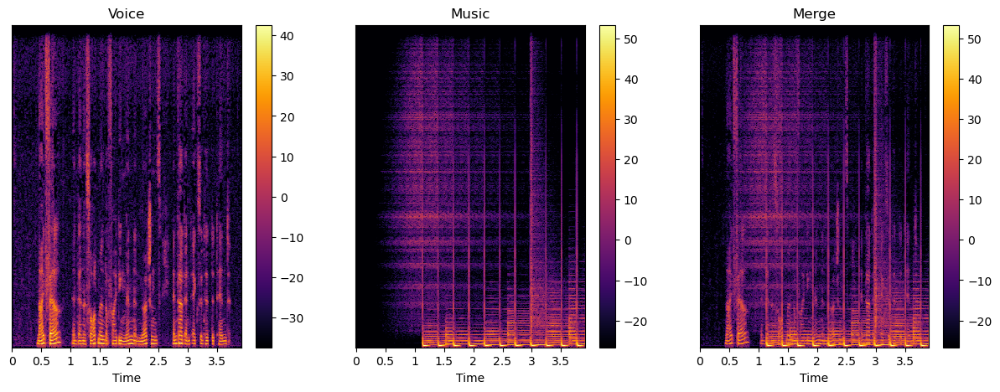

In [2]:
import matplotlib.pyplot as plt

D_voice = librosa.stft(voice_source)
D_music = librosa.stft(music_source)
D_merge = librosa.stft(merge_source)

fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(15,5))

for ax, D, title in zip(axes, [np.abs(D_voice), np.abs(D_music), np.abs(D_merge)], ["Voice", "Music", "Merge"]) : 
    S_db = librosa.amplitude_to_db(D)
    cb = librosa.display.specshow(S_db, x_axis="time", sr=sample_rate * 2, ax=ax, cmap="inferno")
    ax.set_title(title)
    plt.colorbar(cb)

print(D_voice.shape, D_music.shape, D_merge.shape)

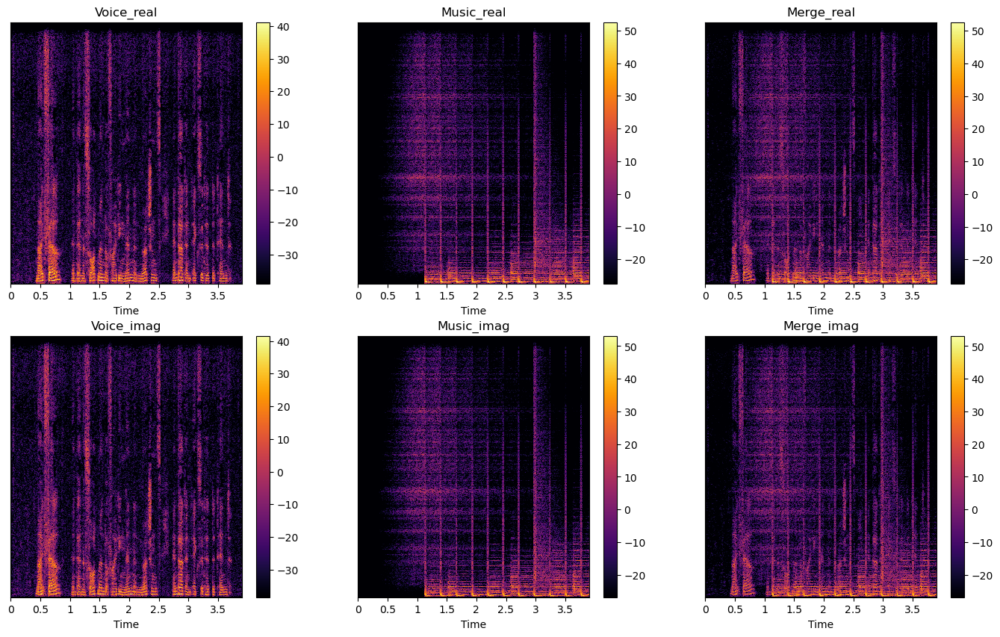

In [3]:
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(17,10))

for ax, D, title in zip(axes[0], [D_voice.real, D_music.real, D_merge.real], ["Voice", "Music", "Merge"]) : 
    S_db = librosa.amplitude_to_db(D)
    cb = librosa.display.specshow(S_db, x_axis="time", sr=sample_rate * 2, ax=ax, cmap="inferno")
    ax.set_title(title + "_real")
    plt.colorbar(cb)

for ax, D, title in zip(axes[1], [D_voice.imag, D_music.imag, D_merge.imag], ["Voice", "Music", "Merge"]) : 
    S_db = librosa.amplitude_to_db(D)
    cb = librosa.display.specshow(S_db, x_axis="time", sr=sample_rate * 2, ax=ax, cmap="inferno")
    ax.set_title(title + "_imag")
    plt.colorbar(cb)

plt.show()

In [4]:
def complex_to_polar(array) : 
    r = np.abs(array)
    angle = np.angle(array)
    
    result_array = np.zeros(shape=(*array.shape, 2), dtype=array[...,0].real.dtype)
    result_array[..., 0] = r
    result_array[..., 1] = angle
    
    return result_array

polar_voice = complex_to_polar(D_voice)
polar_music = complex_to_polar(D_music)
polar_merge = complex_to_polar(D_merge)

print(polar_voice.shape, polar_music.shape, polar_merge.shape)

(1025, 337, 2) (1025, 337, 2) (1025, 337, 2)


In [5]:
from numpy import cos, sin
def polar_to_complex(array) : 
    r = array[..., 0]
    theta = array[..., 1]

    real_part = r * cos(theta)
    imag_part = r * sin(theta)
    
    complex_array = real_part + imag_part * 1j

    return complex_array

# test_output = polar_to_complex(polar_voice)

# print(test_output.shape, D_voice.shape)
# print(test_output[0,:10], D_voice[0,:10], sep="\n\n")
# np.isclose(test_output, D_voice, rtol=0.1)


In [6]:
D_voice_real_inverse = librosa.istft(D_voice.real)
D_music_real_inverse = librosa.istft(D_music.real)
D_merge_real_inverse = librosa.istft(D_merge.real)

D_voice_imag_inverse = librosa.istft(D_voice.imag)
D_music_imag_inverse = librosa.istft(D_music.imag)
D_merge_imag_inverse = librosa.istft(D_merge.imag)

print("Complete part")
for D in [D_voice, D_music, D_merge] : 
    D = librosa.istft(D)
    display(Audio(D, rate=sample_rate))

print("Real part")
for D in [D_voice_real_inverse, D_music_real_inverse, D_merge_real_inverse] : 
    display(Audio(D, rate=sample_rate))

print("Imaginary part")
for D in [D_voice_imag_inverse, D_music_imag_inverse, D_merge_imag_inverse] : 
    display(Audio(D, rate=sample_rate))

print("ABS part")
for D in [D_voice, D_music, D_merge] : 
    D = librosa.istft(np.abs(D))
    display(Audio(D, rate=sample_rate))

Complete part


Real part


Imaginary part


ABS part


In [7]:
from keras.backend import clear_session
from keras import Model, Sequential
from keras.layers import Dense, Conv2D, Dropout, MaxPool2D, AvgPool2D, Reshape, BatchNormalization, Flatten, Dropout, Conv1D

clear_session()
model = Sequential(name="test_layer")
model.add(Conv2D(filters=240, kernel_size=(5, 5), input_shape=(1025, 337, 2), activation="relu", padding="same"))
model.add(MaxPool2D(pool_size=(3, 3)))
model.add(Conv2D(filters=120, kernel_size=(5, 5), activation="relu", padding="same"))
model.add(MaxPool2D(pool_size=(2, 2)))
model.add(BatchNormalization())
model.add(Dropout(0.25))

model.add(Conv2D(filters=60, kernel_size=(3, 3), activation="relu", padding="same"))
model.add(MaxPool2D(pool_size=(2, 2)))
model.add(Conv2D(filters=337, kernel_size=(4, 4), activation="relu"))
model.add(BatchNormalization())
model.add(Dropout(0.25))

model.add(Reshape(target_shape=(1025, 337, 2)))

model.compile(optimizer="adam", loss="mse", metrics=["mse"])

print(model.summary())

Metal device set to: Apple M1 Pro

systemMemory: 16.00 GB
maxCacheSize: 5.33 GB

Model: "test_layer"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 1025, 337, 240)    12240     
                                                                 
 max_pooling2d (MaxPooling2D  (None, 341, 112, 240)    0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 341, 112, 120)     720120    
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 170, 56, 120)     0         
 2D)                                                             
                                                                 
 batch_normalization (BatchN  (None, 170, 56, 120)     480       
 ormalization)                           

In [8]:
print(polar_merge.shape)
print(polar_merge.reshape((1, 1025, 337, 2)).shape)

(1025, 337, 2)
(1, 1025, 337, 2)


In [9]:
from keras.callbacks import Callback, EarlyStopping, ModelCheckpoint
from sklearn.metrics import r2_score

early_stop = EarlyStopping(monitor="loss", patience=200, verbose=False, restore_best_weights=True)
check_point = ModelCheckpoint(filepath="./Model_polar/checkpoints/", monitor="loss", verbose=True, save_best_only=True, save_weights_only=True)
callbacks = [early_stop, check_point]

In [ ]:
history = model.fit(
    polar_merge.reshape((1, 1025, 337, 2)), polar_voice.reshape((1, 1025, 337, 2)), 
    batch_size=1, epochs=4000, verbose=False, callbacks=callbacks, initial_epoch=1000
)
model.save(filepath="./Model_polar/checkpoints/checkpoint.h5")

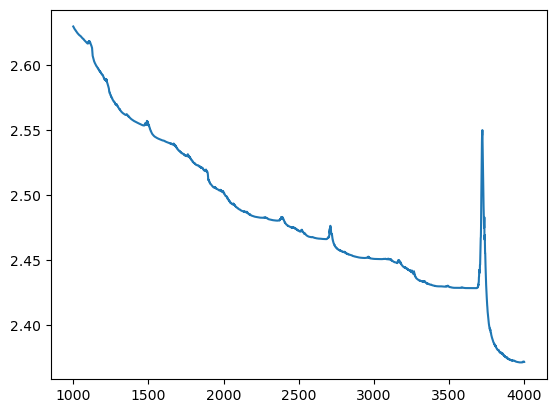

In [16]:
import matplotlib.pyplot as plt

epoch = history.epoch
loss = history.history["loss"]
mse = history.history["mse"]

plt.plot(epoch, loss)
plt.show()

In [17]:
pred_polar = model.predict(polar_merge.reshape((1, 1025, 337, 2)), batch_size=1)
pred = polar_to_complex(pred_polar)

print(pred.shape)

1/1 [==============================] - 0s 20ms/step
(1, 1025, 337)


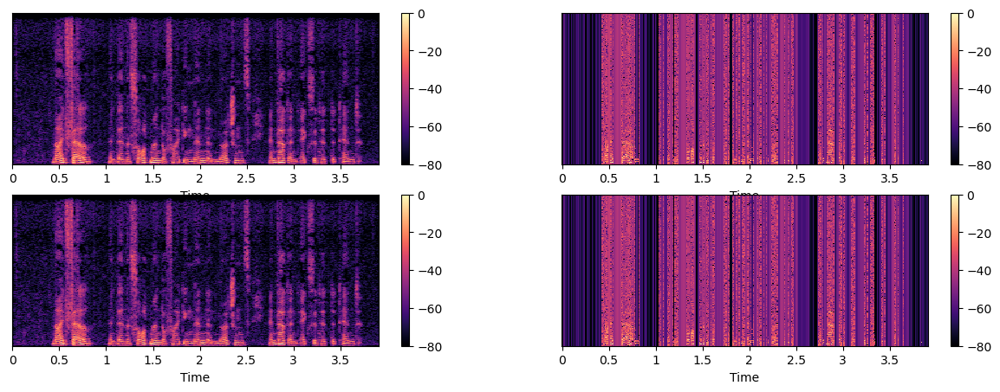

In [18]:
pred = pred.reshape(1025, 337)

fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(15, 5))

for ax, data in zip(axes[0], [np.abs(D_voice), np.abs(pred)]) : 
    D_db = librosa.amplitude_to_db(data, ref=np.max)
    cb = librosa.display.specshow(D_db, x_axis="time", sr=sample_rate * 2, ax=ax)
    plt.colorbar(cb)

for ax, data in zip(axes[1], [np.abs(D_voice), np.abs(pred)]) : 
    D_db = librosa.amplitude_to_db(data, ref=np.max)
    cb = librosa.display.specshow(D_db, x_axis="time", sr=sample_rate * 2, ax=ax)
    plt.colorbar(cb)

plt.show()

In [19]:
voice_inverse = librosa.istft(D_voice)
pred_inverse = librosa.istft(pred)

display(Audio(voice_inverse, rate=sample_rate))
display(Audio(pred_inverse, rate=sample_rate))